# **Task Assigned**

**The RVL-CDIP (Ryerson Vision Lab Complex Document Information Processing) dataset consists of 400,000 grayscale images in 16 classes, with 25,000 images per class. There are 320,000 training images, 40,000 validation images, and 40,000 test images. The images are sized so their largest dimension does not exceed 1000 pixels.Here are the classes in the dataset, and an example from each:**

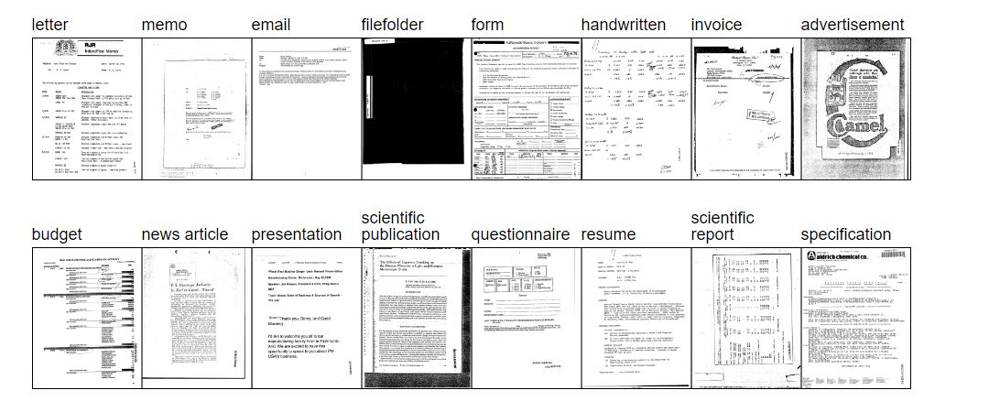

**Details**
The label files list the images and their categories in the following format:

path/to/the/image.tif category
where the categories are numbered 0 to 15, in the following order:

letter,
form,
email,
handwritten,
advertisement,
scientific report,
scientific publication,
specification,
file folder,
news article,
budget,
invoice,
presentation,
questionnaire,
resume,
memo

**Document Image Classification with Intra-Domain
Transfer Learning & Stacked Generalization of
Deep Convolutional Neural Networks**[link 1](https://www.cs.cmu.edu/~aharley/icdar15/harley_convnet_icdar15.pdf)

**Evaluation of Deep Convolutional Nets for
Document Image Classification and Retrieval**[link 2](https://arxiv.org/pdf/1801.09321.pdf)


![alt text](https://github.com/hiarindam/document-image-classification-TL-SG/blob/master/IMG_Flowchart.png?raw=true)

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


# **Data Loading & Preparation**

In [0]:
!wget --header="Host: doc-0g-68-docs.googleusercontent.com" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/78.0.3904.87 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3" --header="Accept-Language: en-IN,en-GB;q=0.9,en-US;q=0.8,en;q=0.7,hi;q=0.6" --header="Referer: https://docs.google.com/uc?id=0Bz1dfcnrpXM-MUt4cHNzUEFXcmc&export=download" --header="Cookie: AUTH_bbebqfqqlbtlmtum1e2p5hui8kvhh83m=06797348977280964480|1573358400000|p1ad1vms5lh75oikat1ms5din9gkngm9" --header="Connection: keep-alive" "https://doc-0g-68-docs.googleusercontent.com/docs/securesc/t927msa9aomceink3i5h96e7q5483raf/345enlov87c36ie80ljjjp1pufmvqi2g/1573358400000/18137660436632322230/06797348977280964480/0Bz1dfcnrpXM-MUt4cHNzUEFXcmc?e=download&authuser=0" -O "rvl-cdip.tar.gz" -c

--2019-11-10 04:56:20--  https://doc-0g-68-docs.googleusercontent.com/docs/securesc/t927msa9aomceink3i5h96e7q5483raf/345enlov87c36ie80ljjjp1pufmvqi2g/1573358400000/18137660436632322230/06797348977280964480/0Bz1dfcnrpXM-MUt4cHNzUEFXcmc?e=download&authuser=0
Resolving doc-0g-68-docs.googleusercontent.com (doc-0g-68-docs.googleusercontent.com)... 66.102.1.132, 2a00:1450:400c:c06::84
Connecting to doc-0g-68-docs.googleusercontent.com (doc-0g-68-docs.googleusercontent.com)|66.102.1.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/x-gzip]
Saving to: ‘rvl-cdip.tar.gz’

rvl-cdip.tar.gz         [                <=> ]  36.10G   171MB/s    in 4m 18s  

2019-11-10 05:00:38 (143 MB/s) - ‘rvl-cdip.tar.gz’ saved [38762320458]



In [0]:
import shutil
import pandas as pd
import os
import numpy as np
import csv

shutil.unpack_archive('rvl-cdip.tar.gz','data')

**Train Set**

In [0]:
txtfile = r"data/labels/train.txt"
csvfile = r"train.csv"
with open(txtfile, 'r') as infile, open(csvfile, 'w') as outfile:
        stripped = (line.strip() for line in infile)
        lines = (line.split(",") for line in stripped if line)
        writer = csv.writer(outfile)
        writer.writerows(lines)
        
#Loading data
df=pd.read_csv("train.csv",header=None)
df.head()

,0
0,imagesq/q/o/c/qoc54c00/80035521.tif 15
1,imagese/e/w/c/ewc23d00/513280028.tif 1
2,imagesw/w/b/t/wbt26e00/2053453161.tif 7
3,imagesm/m/k/m/mkm05e00/2040792992_2040792994.t...
4,imageso/o/e/x/oex80d00/522787731+-7732.tif 3


In [0]:
#naming columns in data
df.columns=['image']

#Splitting the column into 2 columns image and class using space ' ' as delimiter
df = pd.DataFrame(df['image'].str.split(' ',1).tolist(),
                                   columns = ['image','class'])
df.head()

,image,class
0,imagesq/q/o/c/qoc54c00/80035521.tif,15
1,imagese/e/w/c/ewc23d00/513280028.tif,1
2,imagesw/w/b/t/wbt26e00/2053453161.tif,7
3,imagesm/m/k/m/mkm05e00/2040792992_2040792994.tif,10
4,imageso/o/e/x/oex80d00/522787731+-7732.tif,3


In [0]:
df.shape

(320000, 2)

In [0]:
#saving that to csv file
df.to_csv('train.csv')

In [0]:
#changing datatypes fpr easy use
df['image']=df['image'].astype(str)
df['class']=df['class'].astype(int)

In [0]:
os.chdir("data")

In [0]:
os.mkdir("train")

In [0]:
os.chdir("train")

In [0]:
for i in range(16):
    os.mkdir(str(i))

In [0]:
os.chdir("/content")

In [0]:
for i in range(len(df)):
    for j in range(16):
        if df['class'][i]==j:
            shutil.copy2('data/images/'+df['image'][i],'data/train/'+str(j) +'/')
        else:
            continue

In [0]:
#Renaming folder names for train set
class_name={'0':'letter','1':'form','2':'email','3':'handwritten','4':'advertisement','5':'scientific report','6':'scientific publication','7':'specification','8':'file folder','9':'news article','10':'budget','11':'invoice','12':'presentation','13':'questionnaire','14':'resume','15':'memo'}
path = 'data/train'

i = 0
for j in class_name.keys():
    os.rename(path+'/'+j, path+'/'+class_name[j])
    i=i+1

**Test Set**

In [0]:
txtfile = r"data/labels/test.txt"
csvfile = r"test.csv"
with open(txtfile, 'r') as infile, open(csvfile, 'w') as outfile:
        stripped = (line.strip() for line in infile)
        lines = (line.split(",") for line in stripped if line)
        writer = csv.writer(outfile)
        writer.writerows(lines)
        
#Loading data
test=pd.read_csv('test.csv',header=None)


#naming columns
test.columns=['image']

#Splitting column into 2 columns using space ' ' as delimiter
df_test = pd.DataFrame(test['image'].str.split(' ',1).tolist(),
                                   columns = ['image','class'])

#chaning datatypes for easy use
df_test['image']=df_test['image'].astype(str)
df_test['class']=df_test['class'].astype(int)

In [0]:
os.chdir("data")

In [0]:
os.mkdir("test")

In [0]:
os.chdir("test")

In [0]:
for i in range(16):
    os.mkdir(str(i))

In [0]:
os.chdir("/content")

In [0]:
#Pushin images into corresponding folders based on their class number


for i in range(len(df_test)):
    for j in range(16):
        if df_test['class'][i]==j:
            shutil.copy2('data/images/'+df_test['image'][i],'data/test/'+str(j) +'/')
        else:
            continue

In [0]:
#Renaming folder names for test set
class_name={'0':'letter','1':'form','2':'email','3':'handwritten','4':'advertisement','5':'scientific report','6':'scientific publication','7':'specification','8':'file folder','9':'news article','10':'budget','11':'invoice','12':'presentation','13':'questionnaire','14':'resume','15':'memo'}
path = 'data/test'

i = 0
for j in class_name.keys():
    os.rename(path+'/'+j, path+'/'+class_name[j])
    i=i+1

**Validation Set**

In [0]:
txtfile = r"data/labels/val.txt"
csvfile = r"validation.csv"
with open(txtfile, 'r') as infile, open(csvfile, 'w') as outfile:
        stripped = (line.strip() for line in infile)
        lines = (line.split(",") for line in stripped if line)
        writer = csv.writer(outfile)
        writer.writerows(lines)
        
#Loading data
val=pd.read_csv('validation.csv',header=None)

#Renaming columns
val.columns=['image']

#Splitting column into 2 columns using space ' ' as delimiter
df_val = pd.DataFrame(val['image'].str.split(' ',1).tolist(),
                                   columns = ['image','class'])

#Changing datatypes for eay use
df_val['image']=df_val['image'].astype(str)
df_val['class']=df_val['class'].astype(int)

#Checking data to see if it is done or not
df_val.head()

,image,class
0,imagesg/g/t/h/gth35e00/2024525661.tif,11
1,imagesi/i/y/k/iyk38c00/512015827+-5827.tif,0
2,imagesr/r/r/e/rre21e00/87103403.tif,0
3,imagesk/k/s/u/ksu44c00/03636607.tif,4
4,imagesr/r/a/i/rai09d00/50437856-7857.tif,14


In [0]:
os.chdir("data")

In [0]:
os.mkdir("validation")

In [0]:
os.chdir("validation")

In [0]:
for i in range(16):
    os.mkdir(str(i))

In [0]:
os.chdir("/content")

In [0]:
for i in range(len(df_val)):
    for j in range(16):
        if df_val['class'][i]==j:
            shutil.copy2('data/images/'+df_val['image'][i],'data/validation/'+str(j) +'/')
        else:
            continue

In [0]:
#Renaming folder names for validation set
class_name={'0':'letter','1':'form','2':'email','3':'handwritten','4':'advertisement','5':'scientific report','6':'scientific publication','7':'specification','8':'file folder','9':'news article','10':'budget','11':'invoice','12':'presentation','13':'questionnaire','14':'resume','15':'memo'}
path = 'data/validation'

i = 0
for j in class_name.keys():
    os.rename(path+'/'+j, path+'/'+class_name[j])
    i=i+1

# **Importing Dependencies**

In [0]:
import tensorflow as tf
from keras.layers import Conv2D, Input, BatchNormalization, Dropout, Dense, GlobalAvgPool2D, GlobalMaxPooling2D, MaxPooling2D, Flatten
from keras.optimizers import Adam, RMSprop, Adagrad, SGD
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, TensorBoard
from keras.models import Model, load_model, model_from_json
from sklearn.metrics import classification_report, confusion_matrix
from keras.applications.vgg16 import VGG16

Using TensorFlow backend.


In [0]:
train_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)
validation_datagen = ImageDataGenerator(rescale = 1./255)


train_data = train_datagen.flow_from_directory('data/train/',target_size=(256, 256),batch_size=32)

test_data = test_datagen.flow_from_directory('data/test/',target_size=(256, 256),batch_size=32)

validation_data = validation_datagen.flow_from_directory('data/validation/',target_size=(256,256),batch_size=32)

# **Used VGG 16 -----> Holistic**

In [0]:
# Parameters

img_width, img_height = 256,256
model = VGG16(weights = "imagenet", include_top=False, input_shape = (img_width, img_height, 3),)





58892288/58889256 [==============================] - 1s 0us/step








In [0]:
# Fine Tuning of VGG 16 Model
for layer in model.layers:
    layer.trainable=False  
model.layers[-2].trainable=True
model.layers[-3].trainable=True      

#Adding custom Layers 
x = model.output
x = Flatten()(x)
x = Dense(256, activation="relu")(x)
x = Dropout(0.5)(x)
x = Dense(128, activation="relu")(x)
predictions = Dense(16, activation="softmax")(x)

# creating the final model 
model_holistic = Model(input = model.input, output = predictions)

# compile the model 
model_holistic.compile(loss = "categorical_crossentropy", optimizer =Adam(lr=0.0001), metrics=["accuracy"])


Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.




/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("de...)`
  from ipykernel import kernelapp as app


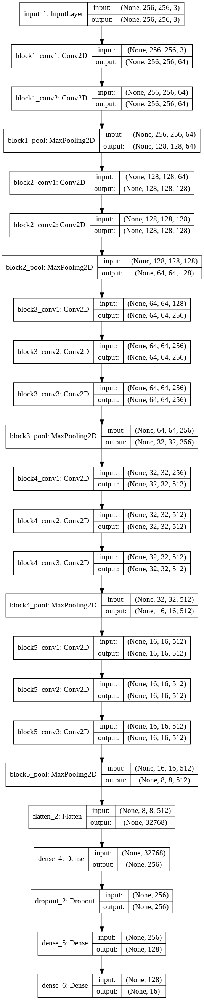

In [0]:
# Visualizing the main ar
from keras.utils import plot_model
import pydot_ng as pydot
plot_model(model_holistic, show_shapes=True, show_layer_names=True, to_file='model_holistic.png')
from IPython.display import Image
Image(retina=True, filename='model_holistic.png')

In [0]:
#Callbacks
logdir = "logs/scalars/"
reduce_learning = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=2, min_lr=0.000001)
model_save = ModelCheckpoint('model_holistic.h5', save_best_only=True, monitor='acc', mode='max')
tensorboard_callback = TensorBoard(log_dir=logdir)

In [0]:
history = model_holistic.fit_generator(
train_data,
steps_per_epoch =319837/128,
epochs=10,    
validation_data=validation_data,
validation_steps=39995/128,
callbacks=[reduce_learning,model_save,tensorboard_callback])

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where




Epoch 1/10
2499/2498 [==============================] - 1203s 481ms/step - loss: 1.1265 - acc: 0.6638 - val_loss: 0.7262 - val_acc: 0.7806

Epoch 2/10
2499/2498 [==============================] - 1160s 464ms/step - loss: 0.7815 - acc: 0.7713 - val_loss: 0.6196 - val_acc: 0.8187
Epoch 3/10
2499/2498 [==============================] - 1169s 468ms/step - loss: 0.7007 - acc: 0.7966 - val_loss: 0.5743 - val_acc: 0.8311
Epoch 4/10
2499/2498 [==============================] - 1170s 468ms/step - loss: 0.6433 - acc: 0.8126 - val_loss: 0.5545 - val_acc: 0.8364
Epoch 5/10
2499/2498 [==============================] - 1142s 457ms/step - loss: 0.5575 - acc: 0.8358 - val_loss: 0.5247 - val_acc: 0.8444
Epoch 6/10
2499/2498 [==============================] - 1179s 472ms/step - loss: 0.5383 - acc: 0.8407 - val_loss: 0.4888 - val_acc: 0.8543
Epoch 7/10
2499/2498 [==============================] - 1182s 473ms

In [0]:
%load_ext tensorboard
%tensorboard --logdir logs

In [0]:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

In [0]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [0]:
weights_file = drive.CreateFile({'title' : '/content/model_holistic.h5'})
weights_file.SetContentFile('/content/model_holistic.h5')
weights_file.Upload()
drive.CreateFile({'id': weights_file.get('id')})

GoogleDriveFile({'id': '1xAebNcLPNHCmPFRUJ7Ur7Aq6irWnHrcc'})

In [0]:
score = model_holistic.evaluate_generator(test_data,steps=39997/128,workers=2, use_multiprocessing=True, verbose=0)

In [0]:
score

[0.44940596929611487, 0.8715055910543131]

**Analysing Results**

In [0]:
# Analysing Results
validation_data = validation_datagen.flow_from_directory('data/validation/',target_size=(256,256),batch_size=32,shuffle = False)
class_labels = validation_data.class_indices
class_labels = {v: k for k, v in class_labels.items()}
classes = list(class_labels.values())


#Confution Matrix and Classification Report
Y_pred = model_holistic.predict_generator(validation_data, 39995//32+1)
y_pred = np.argmax(Y_pred, axis=1)


print('Classification Report')
target_names = list(class_labels.values())
print(classification_report(validation_data.classes, y_pred, target_names=target_names))



Found 39995 images belonging to 16 classes.
Classification Report
                        precision    recall  f1-score   support

         advertisement       0.90      0.91      0.90      2522
                budget       0.84      0.85      0.85      2485
                 email       0.98      0.97      0.98      2530
           file folder       0.89      0.96      0.92      2451
                  form       0.78      0.74      0.76      2537
           handwritten       0.92      0.95      0.93      2434
               invoice       0.89      0.88      0.89      2576
                letter       0.88      0.87      0.87      2430
                  memo       0.92      0.88      0.90      2533
          news article       0.91      0.87      0.89      2526
          presentation       0.75      0.82      0.78      2468
         questionnaire       0.83      0.81      0.82      2516
                resume       0.97      0.90      0.93      2424
scientific publication       0.91    

Confusion Matrix
[[2292    9    3   22   13   18    6    8    5   55   47   18    0   17
     8    1]
 [   6 2124    0   25   39    3   51    6   19    6   68   32    2    3
    86   15]
 [   4    6 2465    1    3    2    1    9    5    6    5    9    1    0
     3   10]
 [  22    2    1 2352    6    3    7    1    1    2   32    7    2    3
     9    1]
 [  18   65    2   30 1881   44  113   64   26    5   27  106    7    1
    96   52]
 [  19    3    1    6   12 2306   12   17    1    1    2   43    1    0
     3    7]
 [   2   64    1   19   97    9 2273   35    5    5    7   13    1    0
    31   14]
 [  10    9   17    9   39   41   23 2110   61    1   31   25    5    4
    36    9]
 [  10   25    5   12   41    5   19   68 2228    4   41   16   10    4
    43    2]
 [  59    8    8   11    4    0    4    4   14 2192   88    9    9   81
    31    4]
 [  33   39    1   56    9    1    4   15   11   37 2025   47    5   10
   167    8]
 [  30   35    2   27   92   48   18   32   13  

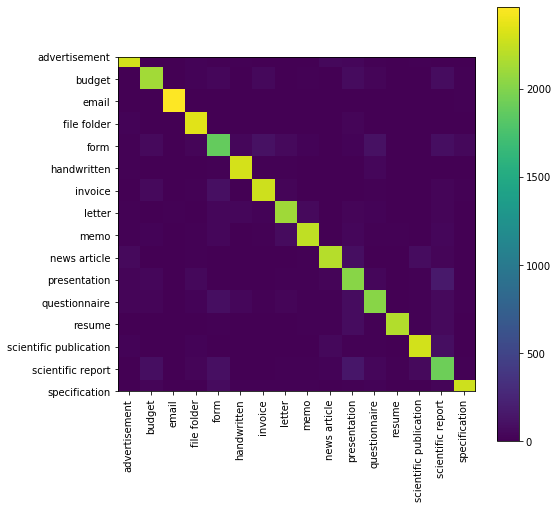

In [0]:
import matplotlib.pyplot as plt
print('Confusion Matrix')
print(confusion_matrix(validation_data.classes, y_pred))

plt.figure(figsize=(8,8))
cnf_matrix = confusion_matrix(validation_data.classes, y_pred)

plt.imshow(cnf_matrix, interpolation='nearest')
plt.colorbar()
tick_marks = np.arange(len(classes))
_ = plt.xticks(tick_marks, classes, rotation=90)
_ = plt.yticks(tick_marks, classes)

In [0]:
# serialize model to JSON
model_holistic = model_holistic.to_json()
with open("model_holistic.json", "w") as json_file:
    json_file.write(model_holistic)

# **Used VGG 16 ----> Header Part**

In [0]:
# Loading Our Trained Model with saved weights
from keras.models import model_from_json

json_file = open('model_holistic.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model_ = model_from_json(loaded_model_json)
# load weights into new model
model_.load_weights("drive/My Drive/ content model_holistic.h5")
print("Loaded model from disk")

Loaded model from disk


In [0]:
model_.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 256, 256, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 256, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 256, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 128, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 128, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 128, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 64, 64, 128)       0   

In [0]:
model_.compile(loss = "categorical_crossentropy", optimizer =Adam(lr=0.0001), metrics=["accuracy"])

In [0]:
model_header_save = ModelCheckpoint('model_header.h5', save_best_only=True, monitor='acc', mode='max')
logdir = "logs/scalars_header/"
tensorboard_callback_h = TensorBoard(log_dir=logdir)

In [0]:
def height_crop_generator(batches):
    while True:
        batch_X, label = next(batches)
        batch_Xcrops = np.zeros((batch_X.shape[0],256,256,3))
        for i in range(batch_X.shape[0]):
            batch_Xcrops[i] = batch_X[i][:256,:,:]
        yield (batch_Xcrops,label)

In [0]:
train_data_h = train_datagen.flow_from_directory('data/train/',batch_size=32,target_size=(512,256))
# load and iterate validation dataset
test_data_h = test_datagen.flow_from_directory('data/test/',batch_size=32,target_size=(512,256))
# load and iterate test dataset
validation_data_h = validation_datagen.flow_from_directory('data/validation/', batch_size=32,target_size=(512,256))

Found 319837 images belonging to 16 classes.
Found 39997 images belonging to 16 classes.
Found 39995 images belonging to 16 classes.


In [0]:
history_ = model_.fit_generator(
height_crop_generator(train_data_h),
steps_per_epoch =319837/128,
epochs=10,    
validation_data=height_crop_generator(validation_data_h),
validation_steps=39995/128,
callbacks=[reduce_learning,model_header_save,tensorboard_callback_h])

Epoch 1/10
2499/2498 [==============================] - 1347s 539ms/step - loss: 0.7938 - acc: 0.7686 - val_loss: 0.6723 - val_acc: 0.8032
Epoch 2/10
2499/2498 [==============================] - 1326s 530ms/step - loss: 0.7095 - acc: 0.7956 - val_loss: 0.6176 - val_acc: 0.8190
Epoch 3/10
2499/2498 [==============================] - 1325s 530ms/step - loss: 0.6677 - acc: 0.8063 - val_loss: 0.5770 - val_acc: 0.8271
Epoch 4/10
2499/2498 [==============================] - 1334s 534ms/step - loss: 0.6212 - acc: 0.8205 - val_loss: 0.5635 - val_acc: 0.8341
Epoch 5/10
2499/2498 [==============================] - 1361s 545ms/step - loss: 0.5531 - acc: 0.8375 - val_loss: 0.5595 - val_acc: 0.8367
Epoch 6/10
2499/2498 [==============================] - 1360s 544ms/step - loss: 0.5465 - acc: 0.8389 - val_loss: 0.5417 - val_acc: 0.8424
Epoch 7/10
2499/2498 [==============================] - 1343s 537ms/step - loss: 0.5415 - acc: 0.8420 - val_loss: 0.5346 - val_acc: 0.8495
Epoch 8/10
2499/2498 [=====

In [61]:
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 1477), started 5:09:37 ago. (Use '!kill 1477' to kill it.)

In [0]:
# Exporting Weights to google drive

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)
weights_file = drive.CreateFile({'title' : '/content/model_header.h5'})
weights_file.SetContentFile('/content/model_header.h5')
weights_file.Upload()
drive.CreateFile({'id': weights_file.get('id')})

GoogleDriveFile({'id': '1BzUrBwn9bFCkgn1D5bnjK2ppYPkkL189'})

In [0]:
# serialize model to JSON
model_header = model_.to_json()
with open("model_header.json", "w") as json_file:
    json_file.write(model_header)

# **Used VGG 16 ----> Bottom Part of an Image**

In [0]:
# Loading Our Trained Model with saved weights
from keras.models import model_from_json

json_file = open('model_holistic.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model_ = model_from_json(loaded_model_json)
# load weights into new model
model_.load_weights("drive/My Drive/ content model_holistic.h5")
print("Loaded model from disk")






Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.






Loaded model from disk


In [0]:
model_.compile(loss = "categorical_crossentropy", optimizer =Adam(lr=0.0001), metrics=["accuracy"])

In [0]:
model_bottom_save = ModelCheckpoint('model_bottome.h5', save_best_only=True, monitor='acc', mode='max')
logdir = "logs/scalars_bottom/"
tensorboard_callback_b = TensorBoard(log_dir=logdir)
reduce_learning = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=2, min_lr=0.000001)

In [0]:
def bottom_crop_generator(batches):
    while True:
        batch_X, label = next(batches)
        batch_Xcrops = np.zeros((batch_X.shape[0],256,256,3))
        for i in range(batch_X.shape[0]):
            batch_Xcrops[i] = batch_X[i][-256:,:,:]
        yield (batch_Xcrops,label)


In [0]:
train_data_b = train_datagen.flow_from_directory('data/train/',batch_size=32,target_size=(512,256))
# load and iterate validation dataset
test_data_b = test_datagen.flow_from_directory('data/test/',batch_size=32,target_size=(512,256))
# load and iterate test dataset
validation_data_b = validation_datagen.flow_from_directory('data/validation/', batch_size=32,target_size=(512,256))

Found 319837 images belonging to 16 classes.
Found 39997 images belonging to 16 classes.
Found 39995 images belonging to 16 classes.


In [0]:
history_ = model_.fit_generator(
bottom_crop_generator(train_data_b),
steps_per_epoch =319837/128,
epochs=5,    
validation_data=bottom_crop_generator(validation_data_b),
validation_steps=39995/128,
callbacks=[reduce_learning,model_bottom_save,tensorboard_callback_b])

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where




Epoch 1/5
2499/2498 [==============================] - 1135s 454ms/step - loss: 0.9887 - acc: 0.7000 - val_loss: 0.7923 - val_acc: 0.7599

Epoch 2/5
2499/2498 [==============================] - 1119s 448ms/step - loss: 0.8377 - acc: 0.7505 - val_loss: 0.7529 - val_acc: 0.7681
Epoch 3/5
1018/2498 [===========>..................] - ETA: 9:57 - loss: 0.8113 - acc: 0.7564

In [0]:
%tensorboard --logdir logs

In [0]:
# Exporting Weights to google drive

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)
weights_file = drive.CreateFile({'title' : '/content/model_bottome.h5'})
weights_file.SetContentFile('/content/model_bottome.h5')
weights_file.Upload()
drive.CreateFile({'id': weights_file.get('id')})

GoogleDriveFile({'id': '1CzJeT0X1ejUDZ5hYNNP6o6-plGp-3lTA'})

In [0]:
# serialize model to JSON
model_bottom = model_.to_json()
with open("model_bottome.json", "w") as json_file:
    json_file.write(model_bottom)

# **Used VGG 16 ----> Left Part of an Image**

In [0]:
from keras.models import model_from_json
json_file = open('model_holistic.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model_ = model_from_json(loaded_model_json)
# load weights into new model
model_.load_weights("drive/My Drive/ content model_holistic.h5")
print("Loaded model from disk")







Loaded model from disk


In [0]:
model_.compile(loss = "categorical_crossentropy", optimizer =Adam(lr=0.0001), metrics=["accuracy"])

In [0]:
model_left_save = ModelCheckpoint('model_left.h5', save_best_only=True, monitor='acc', mode='max')

In [0]:
def left_crop_generator(batches):
    while True:
        batch_X, label = next(batches)
        batch_Xcrops = np.zeros((batch_X.shape[0],256,256,3))
        for i in range(batch_X.shape[0]):
            batch_Xcrops[i] = batch_X[i][:,:256,:]
        yield (batch_Xcrops,label)

In [0]:
train_data_l = train_datagen.flow_from_directory('data/train/',batch_size=32,target_size=(256,512))
# load and iterate validation dataset
test_data_l = test_datagen.flow_from_directory('data/test/',batch_size=32,target_size=(256,512))
# load and iterate test dataset
validation_data_l = validation_datagen.flow_from_directory('data/validation/', batch_size=32,target_size=(256,512))

Found 319837 images belonging to 16 classes.
Found 39997 images belonging to 16 classes.
Found 39995 images belonging to 16 classes.


In [0]:
history_ = model_.fit_generator(
left_crop_generator(train_data_l),
steps_per_epoch =319837/128,
epochs=5,    
validation_data=left_crop_generator(validation_data_l),
validation_steps=39995/128,
callbacks=[reduce_learning,model_left_save])

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Epoch 1/5
2499/2498 [==============================] - 1153s 461ms/step - loss: 0.8781 - acc: 0.7409 - val_loss: 0.6912 - val_acc: 0.7929
Epoch 2/5
2499/2498 [==============================] - 1140s 456ms/step - loss: 0.7406 - acc: 0.7842 - val_loss: 0.6528 - val_acc: 0.8064
Epoch 3/5
2499/2498 [==============================] - 1156s 463ms/step - loss: 0.6869 - acc: 0.8000 - val_loss: 0.6233 - val_acc: 0.8177
Epoch 4/5
2499/2498 [==============================] - 1189s 476ms/step - loss: 0.6600 - acc: 0.8082 - val_loss: 0.6004 - val_acc: 0.8236
Epoch 5/5
2499/2498 [==============================] - 1101s 440ms/step - loss: 0.5588 - acc: 0.8350 - val_loss: 0.5589 - val_acc: 0.8352


In [0]:
# Exporting Weights to google drive

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)
weights_file = drive.CreateFile({'title' : '/content/model_left.h5'})
weights_file.SetContentFile('/content/model_left.h5')
weights_file.Upload()
drive.CreateFile({'id': weights_file.get('id')})

GoogleDriveFile({'id': '1KXvER6MJvX-pejgGCEWTHVKRvEGbaQv5'})

In [0]:
# serialize model to JSON
model_left = model_.to_json()
with open("model_left.json", "w") as json_file:
    json_file.write(model_left)

# **Used VGG 16 ----> Right Part of an Image**

In [0]:
json_file = open('model_holistic.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model_ = model_from_json(loaded_model_json)
# load weights into new model
model_.load_weights("drive/My Drive/ content model_holistic.h5")
print("Loaded model from disk")

Loaded model from disk


In [0]:
model_.compile(loss = "categorical_crossentropy", optimizer =Adam(lr=0.0001), metrics=["accuracy"])

In [0]:
model_right_save = ModelCheckpoint('model_right.h5', save_best_only=True, monitor='acc', mode='max')

In [0]:
def right_crop_generator(batches):
    while True:
        batch_X, label = next(batches)
        batch_Xcrops = np.zeros((batch_X.shape[0],256,256,3))
        for i in range(batch_X.shape[0]):
            batch_Xcrops[i] = batch_X[i][:,-256:,:]
        yield (batch_Xcrops,label)


In [0]:
train_data_r = train_datagen.flow_from_directory('data/train/',batch_size=32,target_size=(256,512))
# load and iterate validation dataset
test_data_r = test_datagen.flow_from_directory('data/test/',batch_size=32,target_size=(256,512))
# load and iterate test dataset
validation_data_r = validation_datagen.flow_from_directory('data/validation/', batch_size=32,target_size=(256,512))

Found 319837 images belonging to 16 classes.
Found 39997 images belonging to 16 classes.
Found 39995 images belonging to 16 classes.


In [0]:
history_ = model_.fit_generator(
right_crop_generator(train_data_r),
steps_per_epoch =319837/128,
epochs=5,    
validation_data=right_crop_generator(validation_data_r),
validation_steps=39995/128,
callbacks=[reduce_learning,model_right_save])

Epoch 1/5
2499/2498 [==============================] - 1118s 447ms/step - loss: 0.5995 - acc: 0.8182 - val_loss: 0.5739 - val_acc: 0.8274
Epoch 2/5
2499/2498 [==============================] - 1132s 453ms/step - loss: 0.6003 - acc: 0.8195 - val_loss: 0.5849 - val_acc: 0.8251
Epoch 3/5
2499/2498 [==============================] - 1112s 445ms/step - loss: 0.5930 - acc: 0.8227 - val_loss: 0.6144 - val_acc: 0.8198
Epoch 4/5
2499/2498 [==============================] - 1097s 439ms/step - loss: 0.4357 - acc: 0.8658 - val_loss: 0.5460 - val_acc: 0.8408
Epoch 5/5
2499/2498 [==============================] - 1136s 455ms/step - loss: 0.4280 - acc: 0.8697 - val_loss: 0.5275 - val_acc: 0.8480


In [0]:
# Exporting Weights to google drive

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)
weights_file = drive.CreateFile({'title' : '/content/model_right.h5'})
weights_file.SetContentFile('/content/model_right.h5')
weights_file.Upload()
drive.CreateFile({'id': weights_file.get('id')})

GoogleDriveFile({'id': '1HiM4Css0SfrqYCNO1e-Md5j9jkP2aXh7'})

In [0]:
# serialize model to JSON
model_right = model_.to_json()
with open("model_right.json", "w") as json_file:
    json_file.write(model_right)

# **Extracting Features**

## Loading Saved Models

In [0]:
# We will load our model with their respective weights

# Holistic Model Loading
json_file = open('model_holistic.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model_holistic = model_from_json(loaded_model_json)
# load weights into new model
model_holistic.load_weights("drive/My Drive/ content model_holistic.h5")
print("Loaded model from disk Holistic")







Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.






Loaded model from disk Holistic


In [0]:
# Header Region Specific Model Loading

json_file = open('model_header.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model_header = model_from_json(loaded_model_json)
# load weights into new model
model_header.load_weights("drive/My Drive/ content model_header.h5")
print("Loaded model from disk Header")

Loaded model from disk Header


In [0]:
# Bottom Region Specific Trained Model Loading

json_file = open('model_bottome.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model_bottom = model_from_json(loaded_model_json)
# load weights into new model
model_bottom.load_weights("drive/My Drive/ content model_bottome.h5")
print("Loaded model from disk Bottom")

Loaded model from disk Bottom


In [0]:
# Left Region Specific Trained Model Loading

json_file = open('model_left.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model_left = model_from_json(loaded_model_json)
# load weights into new model
model_left.load_weights("drive/My Drive/ content model_left.h5")
print("Loaded model from disk Left")

Loaded model from disk Left


In [0]:
# Right Region Specific Trained Model Loading

json_file = open('model_right.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model_right = model_from_json(loaded_model_json)
# load weights into new model
model_right.load_weights("drive/My Drive/ content model_right.h5")
print("Loaded model from disk Right")

Loaded model from disk Right


## Features Extraction ---> Whole Image

In [0]:
train_data_holistic = train_datagen.flow_from_directory('data/train/',batch_size=1,target_size=(256,256),shuffle=False)
test_data_holistic = test_datagen.flow_from_directory('data/test/',batch_size=1,target_size=(256,256),shuffle=False)
validation_data_holistic = validation_datagen.flow_from_directory('data/validation/',batch_size=1,target_size=(256,256),shuffle=False)

Found 319837 images belonging to 16 classes.
Found 39996 images belonging to 16 classes.
Found 39995 images belonging to 16 classes.


In [0]:
%%time
features_train_whole = model_holistic.predict_generator(train_data_holistic,steps = 319837)
features_test_whole = model_holistic.predict_generator(test_data_holistic,steps = 39996)
features_valid_whole = model_holistic.predict_generator(validation_data_holistic,steps = 39995)

CPU times: user 57min 9s, sys: 11min 35s, total: 1h 8min 44s
Wall time: 2h 17min 43s


In [0]:
features_train_whole.shape

(319837, 16)

In [0]:
joblib.dump(features_train_whole,'features_train_whole')

['features_train_whole']

In [0]:
weights_file = drive.CreateFile({'title' : '/content/features_train_whole'})
weights_file.SetContentFile('/content/features_train_whole')
weights_file.Upload()
drive.CreateFile({'id': weights_file.get('id')})

GoogleDriveFile({'id': '1Rf1clMYkf9HgibO0Dv5-35Jk7oT3UDoV'})

## Feature Extraction Header Part

In [0]:
train_data_header = train_datagen.flow_from_directory('data/train/',batch_size=1,target_size=(512,256),shuffle=False)
test_data_header = test_datagen.flow_from_directory('data/test/',batch_size=1,target_size=(512,256),shuffle=False)
validation_data_header = validation_datagen.flow_from_directory('data/validation/',batch_size=1,target_size=(512,256),shuffle=False)

Found 319837 images belonging to 16 classes.


In [0]:
%%time
import numpy as np
features_train_header = model_header.predict_generator(height_crop_generator(train_data_header),steps = 319837)
features_test_header = model_header.predict_generator(height_crop_generator(test_data_header),steps = 39996)
features_valid_header = model_header.predict_generator(height_crop_generator(validation_data_header),steps = 39995)

CPU times: user 1h 7min 54s, sys: 12min 55s, total: 1h 20min 49s
Wall time: 2h 21min 3s


In [0]:
joblib.dump(features_train_header,'features_train_header')

['features_train_header']

In [0]:
weights_file = drive.CreateFile({'title' : '/content/features_train_header'})
weights_file.SetContentFile('/content/features_train_header')
weights_file.Upload()
drive.CreateFile({'id': weights_file.get('id')})

GoogleDriveFile({'id': '1iPQ5vg3-gtk4w41p8PlEkvHJhEejQ0Oy'})

## Feature Extraction Bottom Part

In [0]:
%%time
features_train_bottom = model_bottom.predict_generator(bottom_crop_generator(train_data_header),steps = 319837)
features_test_bottom = model_bottom.predict_generator(bottom_crop_generator(test_data_header),steps = 39996)
features_valid_bottom = model_bottom.predict_generator(bottom_crop_generator(validation_data_header),steps = 39995)

CPU times: user 1h 6min 6s, sys: 12min 44s, total: 1h 18min 51s
Wall time: 2h 25min 47s


In [0]:
import joblib
joblib.dump(features_train_bottom,'features_train_bottom')

['features_train_bottom']

In [0]:
weights_file = drive.CreateFile({'title' : '/content/features_train_bottom'})
weights_file.SetContentFile('/content/features_train_bottom')
weights_file.Upload()
drive.CreateFile({'id': weights_file.get('id')})

GoogleDriveFile({'id': '1yKovyibq-4LjhH3oOZW8uN5JTE6LFL_o'})

## Feature Extraction Right Part

In [0]:
train_data_right = train_datagen.flow_from_directory('data/train/',batch_size=1,target_size=(256,512),shuffle=False)
test_data_right = test_datagen.flow_from_directory('data/test/',batch_size=1,target_size=(256,512),shuffle=False)
validation_data_right = validation_datagen.flow_from_directory('data/validation/',batch_size=1,target_size=(256,512),shuffle=False)

Found 319837 images belonging to 16 classes.


In [0]:
features_train_right = model_right.predict_generator(right_crop_generator(train_data_right),steps = 319837)
features_test_right = model_right.predict_generator(right_crop_generator(test_data_right),steps = 39996)
features_valid_right = model_right.predict_generator(right_crop_generator(validation_data_right),steps = 39995)

In [0]:
features_train_right.shape

(319837, 16)

In [0]:
joblib.dump(features_train_right,'features_train_right')

['features_train_right']

In [0]:
weights_file = drive.CreateFile({'title' : '/content/features_train_right'})
weights_file.SetContentFile('/content/features_train_right')
weights_file.Upload()
drive.CreateFile({'id': weights_file.get('id')})

GoogleDriveFile({'id': '1PQL8c0caHVfhZZ-N_8gM1_PUDBOAy5xF'})

## Feature Extraction Left Part

In [0]:
features_train_left = model_left.predict_generator(left_crop_generator(train_data_right),steps = 319837)
features_test_left = model_left.predict_generator(left_crop_generator(test_data_right),steps = 39996)
features_valid_left = model_left.predict_generator(left_crop_generator(validation_data_right),steps = 39995)

In [0]:
joblib.dump(features_train_left,'features_train_left')

['features_train_left']

In [0]:
weights_file = drive.CreateFile({'title' : '/content/features_train_left'})
weights_file.SetContentFile('/content/features_train_left')
weights_file.Upload()
drive.CreateFile({'id': weights_file.get('id')})

GoogleDriveFile({'id': '1gQAvZBOpuBeRdgQRPDHgmsx2yjY0F-mj'})

## Combining all the extrated features into respective Train,Test,Validation Set

In [0]:
features_train_whole = joblib.load('drive/My Drive/ content features_train_whole')
features_train_header = joblib.load("drive/My Drive/ content features_train_header")
features_train_bottom = joblib.load("drive/My Drive/ content features_train_bottom")
features_train_left  = joblib.load("drive/My Drive/ content features_train_left")
features_train_right  = joblib.load("drive/My Drive/ content features_train_right")

In [0]:
train_features = np.hstack((features_train_whole,features_train_header,features_train_bottom,features_train_left,features_train_right))

In [0]:
train_features.shape

(319837, 80)

In [0]:
test_features = np.hstack((features_test_whole,features_test_header,features_test_bottom,features_test_left,features_test_right))
test_features.shape

(39996, 80)

In [0]:
test_features = joblib.load("drive/My Drive/ content test_features")
test_features.shape

(39996, 80)

In [0]:
valid_features = np.hstack((features_valid_whole,features_valid_header,features_valid_bottom,features_valid_left,features_valid_right))
valid_features.shape

(39995, 80)

In [0]:
valid_features = joblib.load("drive/My Drive/ content valid_features")

In [0]:
valid_features.shape

(39995, 80)

In [0]:
import joblib

In [0]:
joblib.dump(test_features,'test_features')
joblib.dump(valid_features,'valid_features')

['valid_features']

In [0]:
weights_file = drive.CreateFile({'title' : '/content/valid_features'})
weights_file.SetContentFile('/content/valid_features')
weights_file.Upload()
drive.CreateFile({'id': weights_file.get('id')})

GoogleDriveFile({'id': '1pqfhUshcKq90zwocrcyCJjO7PRMP0F_4'})

In [0]:
weights_file = drive.CreateFile({'title' : '/content/test_features'})
weights_file.SetContentFile('/content/test_features')
weights_file.Upload()
drive.CreateFile({'id': weights_file.get('id')})

GoogleDriveFile({'id': '1I9_fxQ9SAjl3ohLSUAfW6ukjXj6RXADb'})

## Taregt Labels

In [0]:
# Labels 
#Loading the true labels 
valid_labels=[]
for i in range(39995):
   batch=next(validation_data_holistic)
   valid_labels.append(batch[1])

In [0]:
joblib.dump(valid_labels,"valid_labels")

['valid_labels']

In [0]:
test_labels=[]
for i in range(39996):
   batch=next(test_data_holistic)
   test_labels.append(batch[1])

In [0]:
joblib.dump(test_labels,"test_labels")

['test_labels']

In [0]:
train_labels=[]
for i in range(319837):
   batch=next(train_data_holistic)
   train_labels.append(batch[1])

In [0]:
joblib.dump(train_labels,"train_labels")

['train_labels']

In [0]:
weights_file = drive.CreateFile({'title' : '/content/train_labels'})
weights_file.SetContentFile('/content/train_labels')
weights_file.Upload()
drive.CreateFile({'id': weights_file.get('id')})

GoogleDriveFile({'id': '1Wi_sBJI7cQY829YdeX1kQv_AgKeJLFFE'})

# **Neural Network on Extracted Features**

In [0]:
train_labels = joblib.load("drive/My Drive/ content train_labels")
test_labels = joblib.load("test_labels")
valid_labels= joblib.load("valid_labels")

In [0]:
test_features = joblib.load("drive/My Drive/ content test_features")
valid_features = joblib.load("drive/My Drive/ content valid_features")

In [65]:
input_ = Input(shape=(80,))
layer_1 = Dense(64,activation="relu")(input_)
dropout_1 = Dropout(0.6)(layer_1)
# batch_normalization = BatchNormalization()(dropout_1)
layer_2 = Dense(32,activation="relu")(dropout_1)
dropout_2 = Dropout(0.5)(layer_2)
output = Dense(16,activation="softmax")(dropout_2)
model = Model(inputs = input_,outputs=output)

In [0]:
model.compile(optimizer=RMSprop(), loss='categorical_crossentropy', metrics=['accuracy'])
logdir = "logs/scalars_metaclassifier/"
model_save = ModelCheckpoint('model_metaclassifier.h5', save_best_only=True, monitor='acc', mode='max')
tensorboard_callback_meta = TensorBoard(log_dir=logdir,histogram_freq=1)

In [67]:
valid_labels =  np.array(valid_labels)
valid_labels = valid_labels.reshape(valid_labels.shape[0],valid_labels.shape[2])
valid_labels.shape

(39995, 16)

In [68]:
train_labels = np.array(train_labels)
train_labels = train_labels.reshape(train_labels.shape[0],train_labels.shape[2])
train_labels.shape

(319837, 16)

In [69]:
test_labels = np.array(test_labels)
test_labels = test_labels.reshape(test_labels.shape[0],test_labels.shape[2])
test_labels.shape

(39996, 16)

In [77]:
history = model.fit(train_features,train_labels, batch_size=128, epochs=1,validation_data=(valid_features,valid_labels),callbacks=[model_save,tensorboard_callback_meta])

Train on 319837 samples, validate on 39995 samples

Epoch 1/1
319837/319837 [==============================] - 14s 45us/step - loss: 0.6160 - acc: 0.8239 - val_loss: 0.2629 - val_acc: 0.9340


In [78]:
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 1477), started 5:25:26 ago. (Use '!kill 1477' to kill it.)

In [79]:
score=model.evaluate(test_features,test_labels,batch_size=32)
print(score)

39996/39996 [==============================] - 2s 61us/step
[0.25901469312153297, 0.9351185118511851]


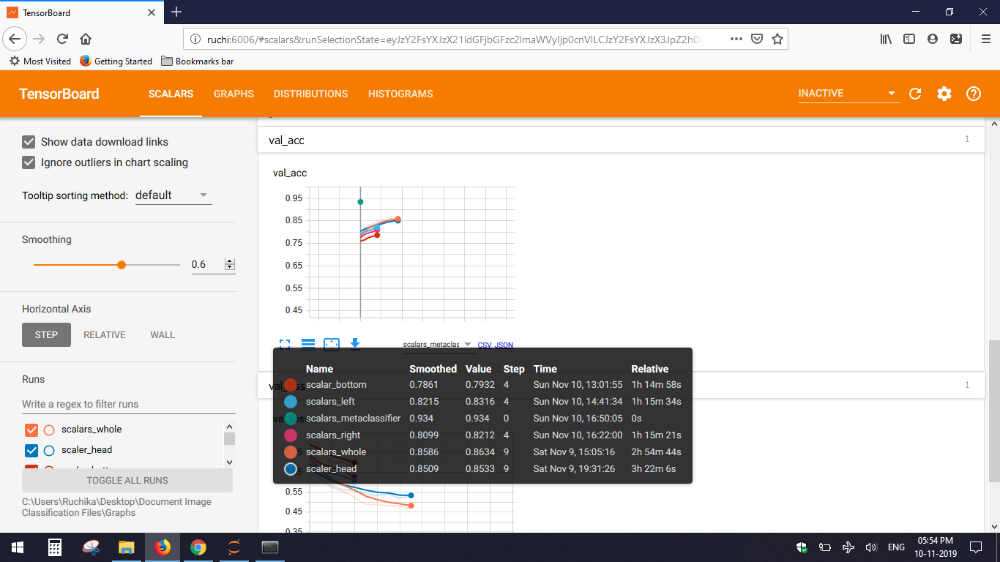

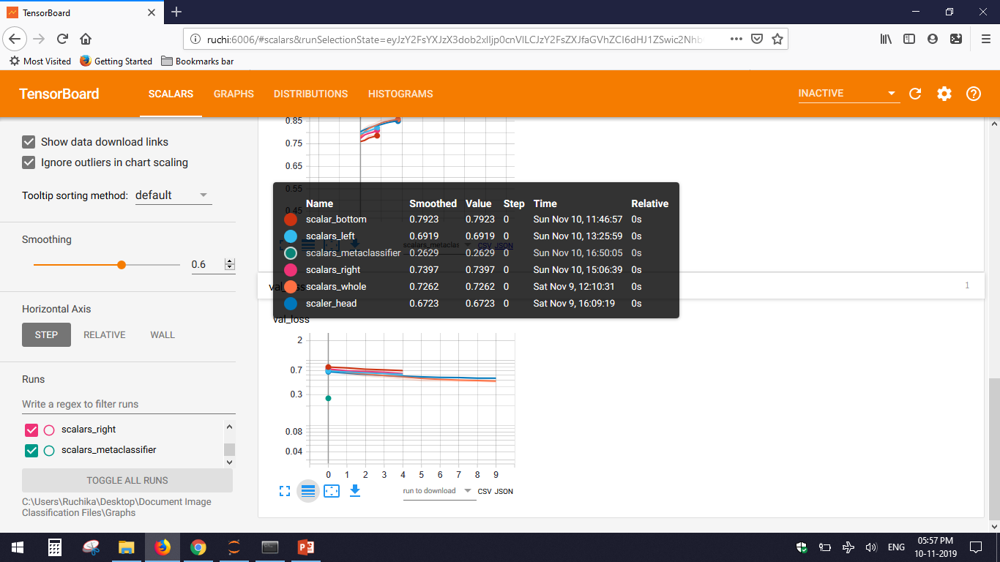

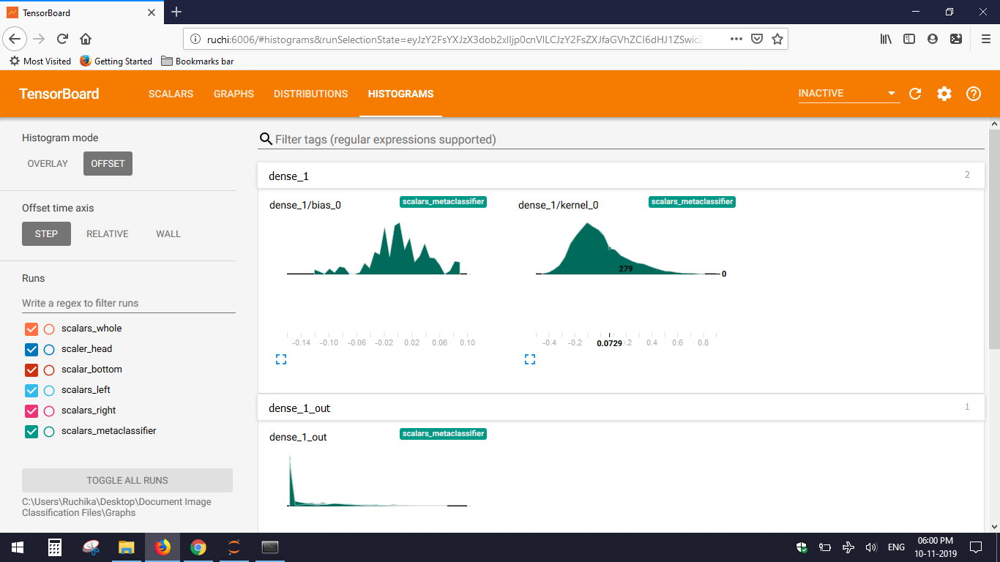